# Dimensionality reduction using PCA

This notebook uses Principal Component Analysis (PCA) to:
 - visualize the data in lower dimensions
 - develop hybrid features for use in supervised machine learning


In [1]:
#123456789012345678901234567890123456789012345678901234567890123456789012345678

In [2]:
import sys
PATH_TO_MODULES = '../..'
sys.path.insert(0, PATH_TO_MODULES)

from helpers import get_quarters, log_transform

# Data Manipulation and Math/Stats Libraries
import numpy as np
import pandas as pd
import scipy.stats as stats
import statsmodels.api as sm

# Sci-kit Learn Functions
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import plotly.express as px
import plotly.graph_objects as go

In [3]:


def process_for_PCA(input_df: pd.DataFrame, 
                    log_transform=False, 
                    remove_QoQ=False) -> pd.DataFrame:
    """Processes a dataframe before applying PCA."""
    # Include only numeric columns
    print('Dropping non-numeric columns.')
    dataset = input_df.select_dtypes(include='number').copy()
    print(f'Remaining dtypes: {dataset.dtypes.unique()}')
    if log_transform:
        print('Applying log transform to the following columns:')
        log_trans_cols = []
        for column in dataset.select_dtypes(include=['float64']).columns:
            if 'QoQ' not in column:
                if 'KPI' not in column:
                    if 'GDP' not in column:
                        if 'Unemployment' not in column:
                            if 'Rate' not in column:
                                if 'Industrial' not in column:
                                    if 'Inflation' not in column:
                                        print(column)
                                        log_trans_cols.append(column)
        for column in log_trans_cols:
            dataset['log2_' + column] = (dataset[column] + 2).apply(
                np.log2).copy()
    if remove_QoQ:
        QoQ_cols = [col for col in dataset.columns if 'QoQ' in col]
        print('\nDropping QoQ columns:')
        for column in QoQ_cols:
            print(column)
        dataset.drop(columns=QoQ_cols, inplace=True)
    print(f'There are {dataset.shape[0]} rows and {dataset.shape[1]} columns in the dataset.')
    scaler = StandardScaler()
    return pd.DataFrame(scaler.fit_transform(dataset))




## Load data and check for missing values

*credit to [Michael P. Notter](https://miykael.github.io/blog/2022/advanced_eda/) for sharing these techniques!*

In [4]:
# Import merged dataset
path = PATH_TO_MODULES + '/datasets/'
input_filename = 'X_train_filled_KPIs_QoQ.csv'
dataset = pd.read_csv(path + input_filename)
print(f'There are {dataset.shape[0]} rows and {dataset.shape[1]} columns in the dataset.')

There are 1905 rows and 284 columns in the dataset.


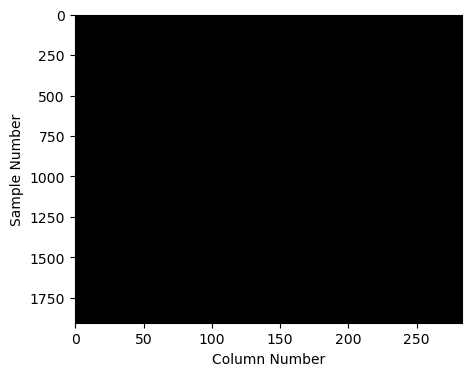

In [5]:
# Missing values show in white in the figure
plt.figure(figsize=(5, 4))
plt.imshow(dataset.isna(), aspect='auto', interpolation='nearest', cmap='gray')
plt.xlabel('Column Number')
plt.ylabel('Sample Number')
plt.show()

In [6]:
# List features missing the most data
dataset.isna().mean().sort_values(ascending=False)[:5]

KPI_NetProfitMargin_Rate    0.0
Unnamed: 0                  0.0
Ticker                      0.0
Name                        0.0
Sector                      0.0
dtype: float64

## Process for PCA, Examine Principal Components

In [7]:
pca_df = process_for_PCA(dataset)

Dropping non-numeric columns.
Remaining dtypes: [dtype('int64') dtype('float64')]
There are 1905 rows and 279 columns in the dataset.


In [8]:
pca = PCA()
X_PCA = pca.fit_transform(pca_df)

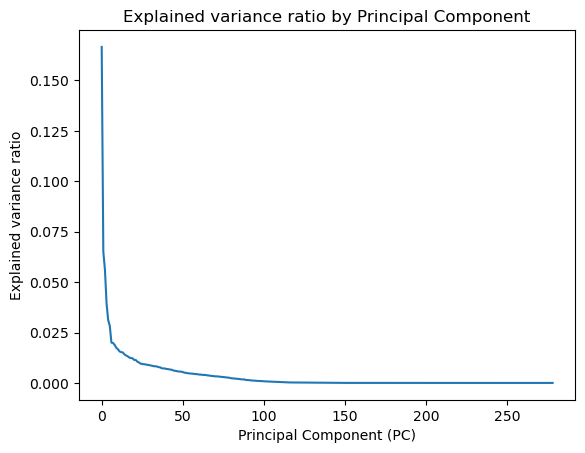

In [9]:
fig = plt.figure()
ax = fig.subplots()
ax.plot(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_)
ax.set_title('Explained variance ratio by Principal Component')
ax.set_ylabel('Explained variance ratio')
ax.set_xlabel('Principal Component (PC)')
plt.show()

Looks like the first few components explain most of the variance in the data.  Let's take a closer look at them.

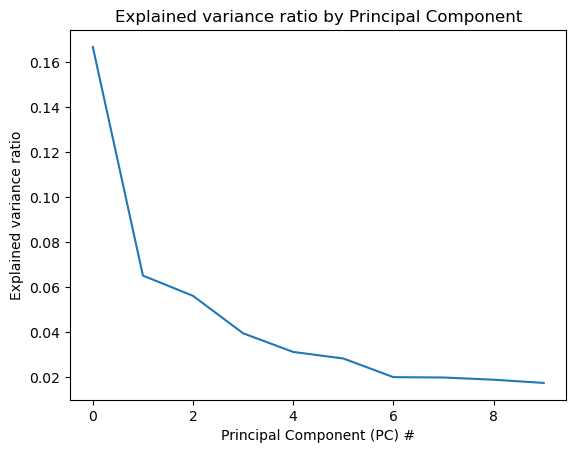

In [10]:
n = 10
fig = plt.figure()
ax = fig.subplots()
ax.plot(range(n), pca.explained_variance_ratio_[:n])
ax.set_title('Explained variance ratio by Principal Component')
ax.set_ylabel('Explained variance ratio')
ax.set_xlabel('Principal Component (PC) #')
plt.show()

In [11]:
explained_variance = np.sum(pca.explained_variance_ratio_[:n])
print(f'The first {n} components explain {explained_variance * 100}% of the variance.')

The first 10 components explain 46.26664673439735% of the variance.


## Visualize data along first two Principal Components

In [12]:
columns = ['PC' + str(i + 1) for i in range(X_PCA.shape[1])]
X_PCA_augmented = pd.concat(
    (
        pd.DataFrame(X_PCA, columns=columns), 
        dataset[['Sector', 'Market Cap', 'Ticker']].copy()
    ), axis=1
)

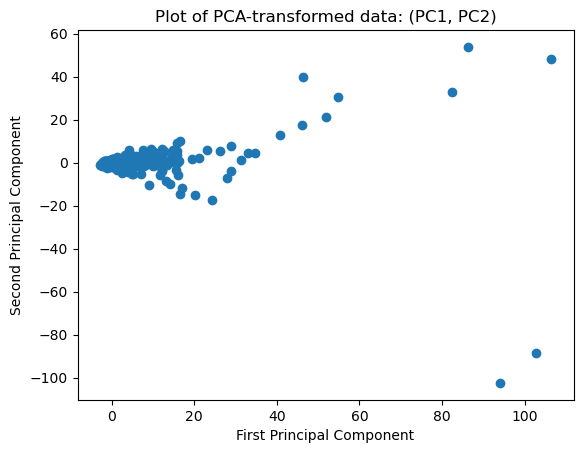

In [13]:
PCA_scatter = plt.figure()
ax = PCA_scatter.subplots()
ax.scatter(X_PCA[:, 0], X_PCA[:, 1])
ax.set_title('Plot of PCA-transformed data: (PC1, PC2)')
ax.set_ylabel('Second Principal Component')
ax.set_xlabel('First Principal Component')
plt.show()

### Improved visualization showing Sector and Market Cap

In [14]:
PCA_viz = alt.Chart(
    X_PCA_augmented,
    title=alt.Title(
        'PCA-transformed data',
        subtitle='(first two Principal Components'
    )
).mark_point().encode(
    alt.X('PC1'),
    alt.Y('PC2'),
    color='Sector',
    shape='Market Cap'
).properties(
    width=400,
    height=300
)

PCA_viz

alt.Chart(...)

### Analysis

We can see that a handful of companies account for most of the variance in the first two principal components, even after the data was standardized (i.e., mean centered and scaled to unit variance).  This is consistent with our early exploration of the data, where we saw a few market giants like Amazon and JP Morgan as outliers in what would otherwise be a fairly normal distribution of smaller companies.

I had attempted a log transform of the data to reduce this distortion, but unfortunately there are many instances where true values are negative (sometimes negative on the order of billions of dollars(!), as with a few instances in NetIncome and oddly, Revenue).

Not sure the best way forward.  We could simply proceed with the data as is, or we could modify the dataset in a few ways:
 - Option One: Drop the outliers and limit our model to those companies that fall within a more moderate range for things like Revenue, Net Income, etc.
 - Option Two: Drop any companies with negative values where having a negative value would be uncommon.  This would also limit the applicability of our model to only those companies with non-negative values in key metrics.

I think for now perhaps it is best to simply explain what we are seeing in the report and move forward.  If we have more time towards the end and want to improve model performance, we could revisit the issue of smoothing out the variance with a log transformation of some kind.

## Proposal for Hybrid Variables


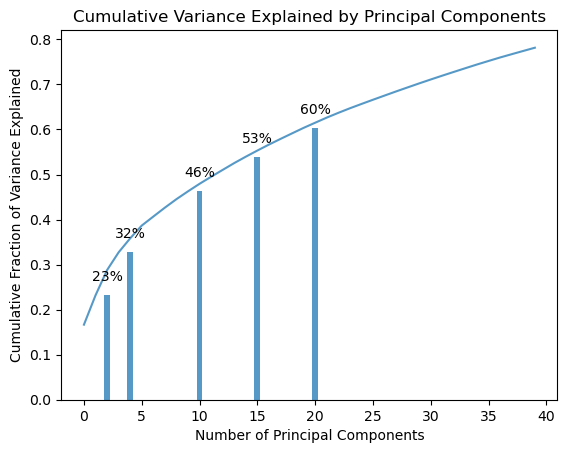

In [15]:
fig = plt.figure()
ax = fig.subplots()
ax.plot(np.arange(0, 40), 
        np.cumsum(pca.explained_variance_ratio_[:40]),
       alpha=0.75
       )
ax.set_title('Cumulative Variance Explained by Principal Components')
ax.set_xlabel('Number of Principal Components')
ax.set_ylabel('Cumulative Fraction of Variance Explained')
subset = [2, 4, 10, 15, 20]
cum_var = [np.sum(pca.explained_variance_ratio_[:i]) for i in subset]
ax.bar(subset, cum_var, width=0.5, alpha=0.75)
for i in range(len(subset)):
    ax.text(subset[i], 
            cum_var[i] +0.025,
            str(int(cum_var[i] * 100)) + '%',
            horizontalalignment='center',
            verticalalignment='bottom',
           )
plt.show()

From the preceding analysis we can see that:
 - the top 20 Principal Components (PCs) explain 60% of the variance in the data
 - the top 10 PCs explain 46% of the variance
 - the top 4 PCs explain 32% of the variance
 - the top 2 PCs explain 23% of the variance

We could try adding each of these subsets to the data that we present to our supervised models and see which subset adds the most value.  Or, if we are okay being less methodical, I think we could just pick one of these subsets.  Going with the top 10 PCs explains almost half the variance in the data... that would be my recommendation.

In [16]:
# Find the top 20 outliers
outliers = set()
top_PC1 = X_PCA_augmented['PC1'].apply(np.abs).sort_values(ascending=False)[:20].index
top_PC2 = X_PCA_augmented['PC2'].apply(np.abs).sort_values(ascending=False)[:20].index
for index in top_PC1:
    outliers.add(X_PCA_augmented['Ticker'].loc[index])
for index in top_PC2:
    outliers.add(X_PCA_augmented['Ticker'].loc[index])
outliers

{'AAPL',
 'AMZN',
 'AVGO',
 'BAC',
 'BK',
 'C',
 'CMCSA',
 'COST',
 'CVS',
 'F',
 'GM',
 'GOOG',
 'HD',
 'JNJ',
 'KKR',
 'META',
 'NVDA',
 'PNC',
 'PRU',
 'STT',
 'T',
 'TFC',
 'TMUS',
 'UNH',
 'USB',
 'VZ',
 'WMT',
 'XOM'}

*Just as we thought... the usual suspects...*